# <font color = "Green"> This notebook is a comprehensive program used for data preprocesssing and build models for Predicting EV Buying Intention

# <font color= "Indigo">Project Team:
<ol>
  <font color= "Indigo"><li>Gayathri Shanmugam</li>
  <li>Kayalvizhi Vellaichamy</li>
  <li>Nitya Malladi</li>
    <li>Saranya Anandan</li>
</ol>

### Context
The global auto manufacturing industry is undergoing rapid transformation by shifting focus from fuel-based vehicles to zero-emission vehicles (ZEVs). ZEVs are further categorized into battery electric vehicles and hydrogen fuel cell electric vehicles. In the United States, the federal government has mandated that at least 50% of the total cars sold should belong to the zero-emission category by the year 2030.
The scope of this project is to build a predictive model which classifies EV buyers in the United States based on their socio-demographic characteristics and their views on the current EV ecosystem. As per a recent survey, 53% of American vehicle users continue to prefer the traditional fuel-based vehicles over electric vehicles.This is a concerning issue for the government, auto companies and their dealers, and needs to be addressed by classifying an EV buyer from a non-buyer. Once the non-buyers are identified, focused strategies can be implemented to convert them into EV buyers

### Data attribute information


In [ ]:
conda install -c conda-forge lightgbm

### Import required packages.

In [54]:
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from mord import LogisticIT

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn import neighbors 
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
import statsmodels.api as sm


from dmba import classificationSummary, gainsChart, liftChart
from dmba import adjusted_r2_score, AIC_score, BIC_score
from dmba import regressionSummary, exhaustive_search 
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import plotDecisionTree, classificationSummary, regressionSummary

from sklearn.neural_network import MLPClassifier, MLPRegressor 
from sklearn.preprocessing import StandardScaler

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

## Loading dataset

In [55]:
# Create data frame for EV data set.
EV_intention_df = pd.read_csv('AfterMerge_Dataset.csv')

# Display the first 10 records of EV_intention_df data frame.
print(EV_intention_df.head(10))


   bichoice  range  home_chg  work_chg  town  highway  gender          state  \
0         0      1         3         1     3        2       0  Massachusetts   
1         0      4         3         3     4        2       0  Massachusetts   
2         0      2         5         0     2        4       0  Massachusetts   
3         0      4         5         0     1        1       0  Massachusetts   
4         0      1         5         0     1        2       0  Massachusetts   
5         0      3        20        10     2        4       0  Massachusetts   
6         1      3         1         1     3        2       0  Massachusetts   
7         0      1         3         3     4        2       0  Massachusetts   
8         0      1         3         5     4        1       0  Massachusetts   
9         0      2         5        20     3        4       0  Massachusetts   

   Region  education  ...  home_parking  home_evse  work_parking  work_evse  \
0       1          4  ...             3 

# Data preprocessing

### Understanding the shape of the dataset

In [56]:
# Determine dimensions of dataframe. 
print('Dimensions of dataframe:',EV_intention_df.shape )
# It has 5898 rows and 27 columns.

Dimensions of dataframe: (5898, 27)


In [57]:
EV_intention_df.duplicated().sum()


0

In [58]:
EV_intention_df.isna().sum()

bichoice        0
range           0
home_chg        0
work_chg        0
town            0
highway         0
gender          0
state           0
Region          0
education       0
employment      0
hsincome        0
hsize           0
housit          0
residence       0
all_cars        0
ev_cars         0
home_parking    0
home_evse       0
work_parking    0
work_evse       0
buycar          0
zipcode         0
dmileage        0
long_dist       0
Age_category    0
RUCA            0
dtype: int64

### Check the data types of the columns for the dataset.

In [59]:
# Display column data types in the dataframe
print('Datatypes of all the columns in the dataset')
print(EV_intention_df.info())
EV_intention_df.describe().T

Datatypes of all the columns in the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5898 entries, 0 to 5897
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   bichoice      5898 non-null   int64 
 1   range         5898 non-null   int64 
 2   home_chg      5898 non-null   int64 
 3   work_chg      5898 non-null   int64 
 4   town          5898 non-null   int64 
 5   highway       5898 non-null   int64 
 6   gender        5898 non-null   int64 
 7   state         5898 non-null   object
 8   Region        5898 non-null   int64 
 9   education     5898 non-null   int64 
 10  employment    5898 non-null   int64 
 11  hsincome      5898 non-null   int64 
 12  hsize         5898 non-null   int64 
 13  housit        5898 non-null   int64 
 14  residence     5898 non-null   int64 
 15  all_cars      5898 non-null   int64 
 16  ev_cars       5898 non-null   int64 
 17  home_parking  5898 non-null   int64 
 18  home

,count,mean,std,min,25%,50%,75%,max
bichoice,5898.0,0.550017,0.497534,0.0,0.0,1.0,1.0,1.0
range,5898.0,2.507460,1.112326,1.0,2.0,3.0,3.0,4.0
home_chg,5898.0,5.943371,6.602592,0.0,1.0,3.0,10.0,20.0
work_chg,5898.0,5.899627,6.574685,0.0,1.0,3.0,10.0,20.0
town,5898.0,2.504408,1.124472,1.0,1.0,3.0,4.0,4.0
highway,5898.0,2.502204,1.115089,1.0,2.0,2.0,3.0,4.0
gender,5898.0,0.503561,0.500030,0.0,0.0,1.0,1.0,1.0
Region,5898.0,2.899288,1.367156,1.0,2.0,3.0,4.0,5.0
education,5898.0,2.703967,0.839617,1.0,2.0,3.0,3.0,4.0
employment,5898.0,1.659207,1.291301,1.0,1.0,1.0,2.0,6.0


- There are no null values
- All columns are integer type except state which is of object datatype
- Some of the attributes need the conversion into their equivalent dummy values

In [60]:
# Display column data types in the dataframe before modification
print('Original Column data types')
print(EV_intention_df.dtypes)

Original Column data types
bichoice         int64
range            int64
home_chg         int64
work_chg         int64
town             int64
highway          int64
gender           int64
state           object
Region           int64
education        int64
employment       int64
hsincome         int64
hsize            int64
housit           int64
residence        int64
all_cars         int64
ev_cars          int64
home_parking     int64
home_evse        int64
work_parking     int64
work_evse        int64
buycar           int64
zipcode          int64
dmileage         int64
long_dist        int64
Age_category     int64
RUCA             int64
dtype: object


In [61]:
#To ordinal encode all the variables except state and zipcode
# Need to change all the variables with multiple classes to 'category'datatype 
EV_intention_df.gender = EV_intention_df.gender.astype('category')
#EV_intention_df.state = EV_intention_df.state.astype('category')
EV_intention_df.employment = EV_intention_df.employment.astype('category')
EV_intention_df.hsize = EV_intention_df.hsize.astype('category')
EV_intention_df.housit = EV_intention_df.housit.astype('category')
EV_intention_df.residence = EV_intention_df.residence.astype('category')
#EV_intention_df.zipcode = EV_intention_df.zipcode.astype('category')
EV_intention_df.buycar = EV_intention_df.buycar.astype('category')
EV_intention_df.home_evse = EV_intention_df.home_evse.astype('category')
EV_intention_df.work_evse = EV_intention_df.work_evse.astype('category')
EV_intention_df.town = EV_intention_df.town.astype('category')
EV_intention_df.highway = EV_intention_df.highway.astype('category')
EV_intention_df.home_parking = EV_intention_df.home_parking.astype('category')
EV_intention_df.work_parking = EV_intention_df.work_parking.astype('category')
EV_intention_df.RUCA = EV_intention_df.RUCA.astype('category')
EV_intention_df.Region = EV_intention_df.Region.astype('category')
EV_intention_df.Age_category = EV_intention_df.Age_category.astype('category')
EV_intention_df.education = EV_intention_df.education.astype('category')
EV_intention_df.hsincome = EV_intention_df.hsincome.astype('category')
EV_intention_df.range = EV_intention_df.range.astype('category')
EV_intention_df.bichoice = EV_intention_df.bichoice.astype('category')

# Display category levels (attributes) and category type.
print(' ')
print('Category levels and changed variable type:')
print(EV_intention_df.gender.cat.categories)
print(EV_intention_df.gender.dtype)
# print(EV_intention_df.state.cat.categories)
# print(EV_intention_df.state.dtype)
print(EV_intention_df.employment.cat.categories)
print(EV_intention_df.employment.dtype)
print(EV_intention_df.hsize.cat.categories)
print(EV_intention_df.hsize.dtype)
print(EV_intention_df.housit.cat.categories)
print(EV_intention_df.housit.dtype)
print(EV_intention_df.residence.cat.categories)
print(EV_intention_df.residence.dtype)
print(EV_intention_df.bichoice.cat.categories)
print(EV_intention_df.bichoice.dtype)
# print(EV_intention_df.zipcode.cat.categories)
# print(EV_intention_df.zipcode.dtype)
print(EV_intention_df.buycar.cat.categories)
print(EV_intention_df.buycar.dtype)
print(EV_intention_df.home_evse.cat.categories)
print(EV_intention_df.home_evse.dtype)
print(EV_intention_df.work_evse.cat.categories)
print(EV_intention_df.work_evse.dtype)
print(EV_intention_df.town.cat.categories)
print(EV_intention_df.town.dtype)
print(EV_intention_df.highway.cat.categories)
print(EV_intention_df.highway.dtype)
print(EV_intention_df.home_parking.cat.categories)
print(EV_intention_df.home_parking.dtype)
print(EV_intention_df.work_parking.cat.categories)
print(EV_intention_df.work_parking.dtype)
print(EV_intention_df.RUCA.cat.categories)
print(EV_intention_df.RUCA.dtype)
print(EV_intention_df.Region.cat.categories)
print(EV_intention_df.Region.dtype)
print(EV_intention_df.Age_category.cat.categories)
print(EV_intention_df.Age_category.dtype)
print(EV_intention_df.education.cat.categories)
print(EV_intention_df.education.dtype)
print(EV_intention_df.hsincome.cat.categories)
print(EV_intention_df.hsincome.dtype)
print(EV_intention_df.range.cat.categories)
print(EV_intention_df.range.dtype)
print(EV_intention_df.bichoice.cat.categories)
print(EV_intention_df.bichoice.dtype)

 
Category levels and changed variable type:
Int64Index([0, 1], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6, 8], dtype='int64')
category
Int64Index([0, 1], dtype='int64')
category
Int64Index([1, 2, 3], dtype='int64')
category
Int64Index([1, 2, 3], dtype='int64')
category
Int64Index([1, 2, 3], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Inde

In [65]:
# Display column data types in the dataframe after modification
print('Modified Column data types')
print(EV_intention_df.dtypes)

Modified Column data types
bichoice        category
range           category
home_chg           int64
work_chg           int64
town            category
highway         category
gender          category
state             object
Region          category
education       category
employment      category
hsincome        category
hsize           category
housit          category
residence       category
all_cars           int64
ev_cars            int64
home_parking    category
home_evse       category
work_parking    category
work_evse       category
buycar          category
zipcode            int64
dmileage           int64
long_dist          int64
Age_category    category
RUCA            category
dtype: object


### Data summary

In [66]:
# Use describe() function to display column statistics for the entire data set. 
np.round(EV_intention_df.describe(), decimals=2).T

,count,mean,std,min,25%,50%,75%,max
home_chg,5898.0,5.94,6.60,0.0,1.0,3.0,10.0,20.0
work_chg,5898.0,5.90,6.57,0.0,1.0,3.0,10.0,20.0
all_cars,5898.0,1.58,0.72,1.0,1.0,1.0,2.0,4.0
ev_cars,5898.0,0.08,0.30,0.0,0.0,0.0,0.0,4.0
zipcode,5898.0,52330.80,29095.13,1247.0,29483.0,48073.0,78258.0,99703.0
dmileage,5898.0,24.75,20.35,0.0,10.0,20.0,30.0,100.0
long_dist,5898.0,1.49,1.32,0.0,0.0,1.0,2.0,4.0


### Splitting and scaling


In [67]:
#Develop predictors X and output variable Y for the data set.
X = EV_intention_df.drop(columns=['bichoice','zipcode','state'])
y = EV_intention_df['bichoice']

# Develop training (60%) and validation(40% or 0.4) partitions for
# heart_disease_df data frame.
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.3, random_state=1)
print('Training : ', train_X.shape)
print('Validation : ', valid_X.shape)

Training :  (4128, 24)
Validation :  (1770, 24)


In [68]:
print('Predictors list')
print(X.columns)

Predictors list
Index(['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA'],
      dtype='object')


In [69]:
scaler = StandardScaler()

In [70]:
# Note the use of an array of column names.
scaler.fit(train_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA']])  


StandardScaler()

In [71]:
# Transform the full data set into standardized (normalized) data set. 
#train_X.reset_index(drop=True,inplace=True)
train_X = pd.concat([pd.DataFrame(scaler.transform(train_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA']]), 
                                    columns=['zrange', 'zhome_chg', 'zwork_chg', 'ztown', 'zhighway', 'zgender', 'zRegion',
       'zeducation', 'zemployment', 'zhsincome', 'zhsize', 'zhousit', 'zresidence',
       'zall_cars', 'zev_cars', 'zhome_parking', 'zhome_evse', 'zwork_parking',
       'zwork_evse', 'zbuycar', 'zdmileage', 'zlong_dist', 'zAge_category', 'zRUCA'],index=train_X.index),
                       train_X ], axis=1)
print('Standardized (Normalized) Values of EV Intention Data Set')
print()
print(train_X)

Standardized (Normalized) Values of EV Intention Data Set

        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
5495  1.325118  -0.150337  -0.126720  0.445019  1.348281 -1.031504  1.533678   
2146  1.325118   0.602443  -0.587059 -1.323064  1.348281  0.969458 -0.654212   
1893  1.325118  -0.602005   2.174977 -0.439022 -1.349152  0.969458 -0.654212   
4741  0.434079   0.602443  -0.433613 -1.323064 -0.450008 -1.031504  0.804382   
1686 -0.456960   0.602443  -0.126720 -0.439022 -0.450008  0.969458 -0.654212   
...        ...        ...        ...       ...       ...       ...       ...   
905  -1.347998  -0.602005   2.174977 -0.439022  1.348281 -1.031504 -0.654212   
5192  0.434079   0.602443  -0.126720  1.329060  1.348281  0.969458  1.533678   
3980 -1.347998  -0.150337  -0.126720 -1.323064  0.449137 -1.031504 -0.654212   
235  -0.456960   2.108003  -0.126720  1.329060 -0.450008  0.969458 -1.383508   
5157  0.434079  -0.451449  -0.893952 -0.439022 -1.349152  0.9

In [72]:
# Transform the full data set into standardized (normalized) data set. 
#valid_X.reset_index(drop=True,inplace=True)
valid_X = pd.concat([pd.DataFrame(scaler.transform(valid_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA']]), 
                                    columns=['zrange', 'zhome_chg', 'zwork_chg', 'ztown', 'zhighway', 'zgender', 'zRegion',
       'zeducation', 'zemployment', 'zhsincome', 'zhsize', 'zhousit', 'zresidence',
       'zall_cars', 'zev_cars', 'zhome_parking', 'zhome_evse', 'zwork_parking',
       'zwork_evse', 'zbuycar', 'zdmileage', 'zlong_dist', 'zAge_category', 'zRUCA'],index=valid_X.index),
                       valid_X ], axis=1)
print('Standardized (Normalized) Values of EV Intention Data Set')
print()
print(valid_X)

Standardized (Normalized) Values of EV Intention Data Set

        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
573  -0.456960  -0.903117  -0.433613 -0.439022 -1.349152 -1.031504 -1.383508   
3219  0.434079   2.108003  -0.740506 -0.439022  0.449137 -1.031504  0.075085   
4436 -1.347998   2.108003  -0.587059  0.445019 -0.450008  0.969458  0.804382   
3887  0.434079   0.602443   2.174977 -0.439022 -0.450008 -1.031504  0.075085   
3656  1.325118  -0.150337   0.640513  0.445019 -0.450008 -1.031504  0.075085   
...        ...        ...        ...       ...       ...       ...       ...   
3321 -0.456960  -0.602005  -0.126720  1.329060 -1.349152 -1.031504  0.075085   
2105 -0.456960  -0.451449  -0.740506 -0.439022  1.348281  0.969458 -0.654212   
710   1.325118  -0.602005   2.174977 -0.439022 -1.349152 -1.031504 -1.383508   
4302  1.325118  -0.602005  -0.126720  0.445019 -1.349152  0.969458  0.804382   
3201  0.434079  -0.602005   0.640513 -0.439022 -0.450008 -1.0

In [73]:
train_X_s = train_X.drop(columns= ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA'])
print(train_X_s)

valid_X_s = valid_X.drop(columns= ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA'])
print(valid_X_s)



        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
5495  1.325118  -0.150337  -0.126720  0.445019  1.348281 -1.031504  1.533678   
2146  1.325118   0.602443  -0.587059 -1.323064  1.348281  0.969458 -0.654212   
1893  1.325118  -0.602005   2.174977 -0.439022 -1.349152  0.969458 -0.654212   
4741  0.434079   0.602443  -0.433613 -1.323064 -0.450008 -1.031504  0.804382   
1686 -0.456960   0.602443  -0.126720 -0.439022 -0.450008  0.969458 -0.654212   
...        ...        ...        ...       ...       ...       ...       ...   
905  -1.347998  -0.602005   2.174977 -0.439022  1.348281 -1.031504 -0.654212   
5192  0.434079   0.602443  -0.126720  1.329060  1.348281  0.969458  1.533678   
3980 -1.347998  -0.150337  -0.126720 -1.323064  0.449137 -1.031504 -0.654212   
235  -0.456960   2.108003  -0.126720  1.329060 -0.450008  0.969458 -1.383508   
5157  0.434079  -0.451449  -0.893952 -0.439022 -1.349152  0.969458  1.533678   

      zeducation  zemployment  zhsincom

# <font color= "Green">BUILDING THE DATA MINING METHODS:
<ol>
  <font color= "Indigo"><li>Logistic Regression</li>
      <li>Classification Trees</li>
      <li>Random forest trees</li>
  <li>Boosted trees</li>
    <li>Neural Networks</li>
</ol>

## logistic regression 

In [87]:
# Using LogisticRegression() function, fit multiple predictors logistic 
# regression for training partition. Set penalty='l2' for regularization. 
# Regularization is any modification to a learning algorithm that is 
# intended to reduce its generalization error but not its training error.
# Regularization can be used to train models that generalize 
# better on unseen data by preventing the algorithm from overfitting 
# the training data set.
# Parameter C=1e42 and penalty=l2 lead to ordinal logistic regression. 
# solver='liblinear' is used for automated selection of the best parameters
# of the logistis regression; recommended for large-scale classification.
log_reg = LogisticRegression(penalty='l2', C=1e42, solver='liblinear')
log_reg.fit(train_X_s, train_y)

# Show intercept and coefficients of the multiple predictors' logistic model.
print('Parameters of Logistic Regresion Model with Multiple Predictors')
print('Intercept:', np.round(log_reg.intercept_[0], decimals=3))
print('Coefficients for Predictors')
print(pd.DataFrame({'Coeff:': np.round(log_reg.coef_[0], decimals=3)}, 
                    index=train_X_s.columns).transpose())

Parameters of Logistic Regresion Model with Multiple Predictors
Intercept: 0.242
Coefficients for Predictors
        zrange  zhome_chg  zwork_chg  ztown  zhighway  zgender  zRegion  \
Coeff:   0.404     -0.183     -0.147 -0.262     0.038    0.144    0.038   

        zeducation  zemployment  zhsincome  ...  zev_cars  zhome_parking  \
Coeff:        0.08        0.108     -0.005  ...     0.189          0.052   

        zhome_evse  zwork_parking  zwork_evse  zbuycar  zdmileage  zlong_dist  \
Coeff:       0.065         -0.076      -0.044   -0.125      0.004      -0.039   

        zAge_category  zRUCA  
Coeff:         -0.183 -0.001  

[1 rows x 24 columns]


In [88]:
# Make predictions for validation set using multiple
# predictors logistic regression model. 

# Predict multiple predictors logistic model's results 
# (0 or 1) for validation set.
log_pred = log_reg.predict(valid_X_s)

# Predict multiple predictors logistic model's probabilities 
# p(0) and p(1) for validation set.
log_prob = np.round(log_reg.predict_proba(valid_X_s), decimals=4)

# Create data frame to show multiple predictors logistic
# model resuts for validation set. 
log_result = pd.DataFrame({'Actual': valid_y, 
                    'Classification': log_pred,
                    'p(0)': [p[0] for p in log_prob],
                    'p(1)': [p[1] for p in log_prob]
})

print('Classification for Validation Partition')
print(log_result.head(20))

Classification for Validation Partition
     Actual  Classification    p(0)    p(1)
573       1               0  0.5183  0.4817
3219      1               1  0.4341  0.5659
4436      0               0  0.6401  0.3599
3887      1               1  0.4180  0.5820
3656      1               1  0.2637  0.7363
3680      1               1  0.4156  0.5844
1513      1               1  0.2667  0.7333
79        1               1  0.3175  0.6825
4072      1               1  0.2094  0.7906
3259      0               1  0.4748  0.5252
4765      0               1  0.2113  0.7887
5613      1               0  0.6322  0.3678
2754      1               1  0.3392  0.6608
5194      1               1  0.4005  0.5995
4809      0               0  0.6791  0.3209
850       1               0  0.5707  0.4293
689       0               1  0.4402  0.5598
4804      1               0  0.6015  0.3985
4451      1               0  0.6195  0.3805
2815      0               1  0.3613  0.6387


In [89]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, log_reg.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6323739630439724


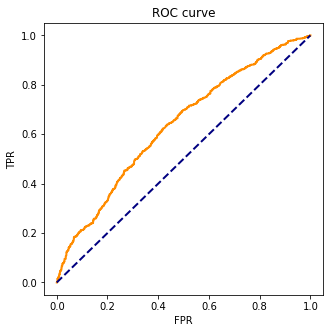

In [90]:
roc_auc_score(valid_y, log_reg.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, log_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [91]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, log_reg.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, log_reg.predict(valid_X_s))
print(classification_report(valid_y, log_reg.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 0.6265)

       Prediction
Actual    0    1
     0  889  948
     1  594 1697

Validation Partition
Confusion Matrix (Accuracy 0.6045)

       Prediction
Actual   0   1
     0 393 424
     1 276 677
              precision    recall  f1-score   support

           0       0.59      0.48      0.53       817
           1       0.61      0.71      0.66       953

    accuracy                           0.60      1770
   macro avg       0.60      0.60      0.59      1770
weighted avg       0.60      0.60      0.60      1770



<AxesSubplot:>

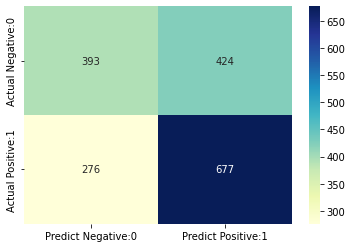

In [92]:
cm = confusion_matrix(valid_y, log_reg.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# Logistic Regression using Grid search

In [31]:
# Identify grid search parameters. 
param_grid = {
    "penalty":["l1","l2"] ,"C":[0.001, 0.01, 0.1, 1, 10, 100, 1000]
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer.
log_reg = LogisticRegression(C=1e42, solver='liblinear')
gridSearch_log = GridSearchCV(log_reg, 
                          param_grid, cv=5, n_jobs=-1, return_train_score=True)
gridSearch_log.fit(train_X_s, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch_log.best_score_:.4f}')
print('Best parameter: ', gridSearch_log.best_params_)

Best score:0.6180
Best parameter:  {'C': 1, 'penalty': 'l2'}


In [32]:
# Make predictions for validation set using multiple
# predictors logistic regression model. 

# Predict multiple predictors logistic model's results 
# (0 or 1) for validation set.
log_pred_g = gridSearch_log.predict(valid_X_s)

# Predict multiple predictors logistic model's probabilities 
# p(0) and p(1) for validation set.
log_prob_g = np.round(gridSearch_log.predict_proba(valid_X_s), decimals=4)

# Create data frame to show multiple predictors logistic
# model resuts for validation set. 
log_result_g = pd.DataFrame({'Actual': valid_y, 
                    'Classification': log_pred_g,
                    'p(0)': [p[0] for p in log_prob_g],
                    'p(1)': [p[1] for p in log_prob_g]
})

print('Classification for Validation Partition')
print(log_result_g.head(20))

Classification for Validation Partition
     Actual  Classification    p(0)    p(1)
573       1               0  0.5182  0.4818
3219      1               1  0.4342  0.5658
4436      0               0  0.6399  0.3601
3887      1               1  0.4182  0.5818
3656      1               1  0.2640  0.7360
3680      1               1  0.4157  0.5843
1513      1               1  0.2669  0.7331
79        1               1  0.3177  0.6823
4072      1               1  0.2097  0.7903
3259      0               1  0.4749  0.5251
4765      0               1  0.2116  0.7884
5613      1               0  0.6321  0.3679
2754      1               1  0.3394  0.6606
5194      1               1  0.4006  0.5994
4809      0               0  0.6788  0.3212
850       1               0  0.5705  0.4295
689       0               1  0.4403  0.5597
4804      1               0  0.6014  0.3986
4451      1               0  0.6193  0.3807
2815      0               1  0.3614  0.6386


In [33]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch_log.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6323521290108798


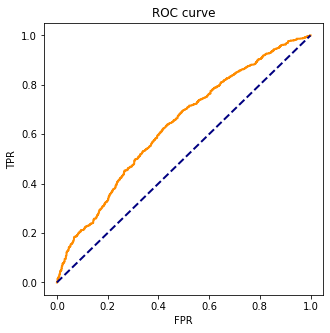

In [34]:
roc_auc_score(valid_y, gridSearch_log.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, log_prob_g[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [35]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, gridSearch_log.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, gridSearch_log.predict(valid_X_s))
print(classification_report(valid_y, gridSearch_log.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 0.6267)

       Prediction
Actual    0    1
     0  889  948
     1  593 1698

Validation Partition
Confusion Matrix (Accuracy 0.6045)

       Prediction
Actual   0   1
     0 393 424
     1 276 677
              precision    recall  f1-score   support

           0       0.59      0.48      0.53       817
           1       0.61      0.71      0.66       953

    accuracy                           0.60      1770
   macro avg       0.60      0.60      0.59      1770
weighted avg       0.60      0.60      0.60      1770



<AxesSubplot:>

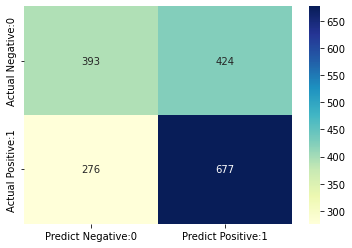

In [36]:
cm = confusion_matrix(valid_y, gridSearch_log.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# KNN Classifier

In [93]:
# Apply NearestNeighbors() function for k=3 in training 
# parition. 
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(train_X_s, train_y)

KNeighborsClassifier(n_neighbors=3)

In [94]:
# Make EV intention classification for validation set 
# using EV intention KNN model. 

# Use knn model to classify EV intention
# for validation set.
EV_pred_knn = knn.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_knn = np.round(knn.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_knn_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_knn],
                'p(1)': [p[1] for p in EV_pred_prob_knn],
                'Classification': EV_pred_knn})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_knn_result.head(10))

Classification for EV intention Data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.0000  1.0000               1
3219      1  0.0000  1.0000               1
4436      0  0.6667  0.3333               0
3887      1  0.3333  0.6667               1
3656      1  0.0000  1.0000               1
3680      1  0.6667  0.3333               0
1513      1  0.0000  1.0000               1
79        1  0.3333  0.6667               1
4072      1  0.6667  0.3333               0
3259      0  0.6667  0.3333               0


In [95]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, knn.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7583178033421483


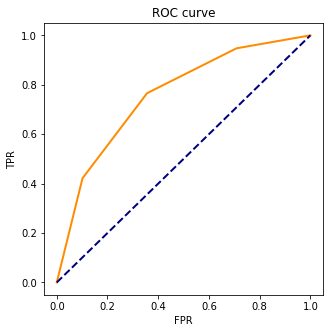

In [96]:
roc_auc_score(valid_y, knn.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_knn[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [97]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, knn.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, knn.predict(valid_X_s))
print(classification_report(valid_y, knn.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 0.8653)

       Prediction
Actual    0    1
     0 1544  293
     1  263 2028

Validation Partition
Confusion Matrix (Accuracy 0.7096)

       Prediction
Actual   0   1
     0 526 291
     1 223 730
              precision    recall  f1-score   support

           0       0.70      0.64      0.67       817
           1       0.71      0.77      0.74       953

    accuracy                           0.71      1770
   macro avg       0.71      0.70      0.71      1770
weighted avg       0.71      0.71      0.71      1770



<AxesSubplot:>

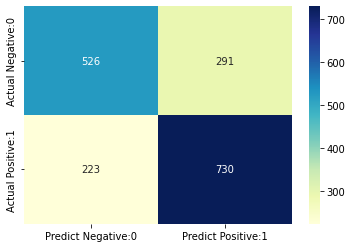

In [98]:
cm = confusion_matrix(valid_y, knn.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [99]:
# Identify best k value for number of nearest neighbors using 
# validation partition.

# Develop k-NN classifier using training partition for various
# values of k and then identify accuracy score using validation
# partition. Accuracy score (accuracy) means a probability of 
# correct predictions with the k-NN classifier. 
results = []
for k in range(1, 15):
    # Train knn classifier using training partition.
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X_s, train_y)
    results.append({
        'k': k,
        # For each k, identify accuracy score using validation 
        # partition.
        'Accuracy Score': accuracy_score(valid_y, knn.predict(valid_X_s))
    })

# Convert results to a pandas data frame. The smallest k value 
# with the highest accuracy is the best k to apply in k-NN 
# classifier. 
results = pd.DataFrame(results)
print(results)

     k  Accuracy Score
0    1        0.725989
1    2        0.682486
2    3        0.709605
3    4        0.703390
4    5        0.685876
5    6        0.684746
6    7        0.670056
7    8        0.667232
8    9        0.661582
9   10        0.657627
10  11        0.648588
11  12        0.641243
12  13        0.651977
13  14        0.641808


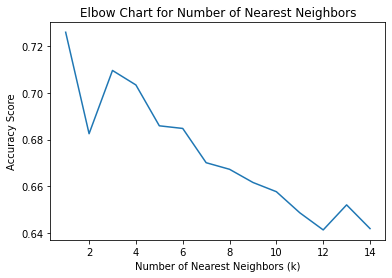

In [100]:
# Develop and display Elbow chart to compare accuracy_score with 
# number of nearest neighbors, k, from 1 to 20. 
ax = results.plot(x='k', y='Accuracy Score')
plt.xlabel('Number of Nearest Neighbors (k)')
plt.ylabel('Accuracy Score')

plt.title('Elbow Chart for Number of Nearest Neighbors')
ax.legend().set_visible(False)
plt.show()

# KNN using Grid search

In [45]:
# Identify grid search parameters. 
param_grid = {
    'n_neighbors': list(range(1, 31))
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer.
knn_g = KNeighborsClassifier()
gridSearch_knn = GridSearchCV(knn_g, 
                          param_grid, cv=5, n_jobs=-1,scoring='accuracy',return_train_score=True)
gridSearch_knn.fit(train_X_s, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch_knn.best_score_:.4f}')
print('Best parameter: ', gridSearch_knn.best_params_)

Best score:0.7020
Best parameter:  {'n_neighbors': 1}


In [46]:
# Make EV intention classification for validation set 
# using EV intention KNN model. 

# Use knn model to classify EV intention
# for validation set.
EV_pred_knn_g = gridSearch_knn.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_knn_g = np.round(gridSearch_knn.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_knn_result_g = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_knn_g],
                'p(1)': [p[1] for p in EV_pred_prob_knn_g],
                'Classification': EV_pred_knn_g})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_knn_result_g.head(10))

Classification for EV intention Data for Validation Partition
     Actual  p(0)  p(1)  Classification
573       1   0.0   1.0               1
3219      1   0.0   1.0               1
4436      0   0.0   1.0               1
3887      1   0.0   1.0               1
3656      1   0.0   1.0               1
3680      1   0.0   1.0               1
1513      1   0.0   1.0               1
79        1   1.0   0.0               0
4072      1   1.0   0.0               0
3259      0   1.0   0.0               0


In [47]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch_knn.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7223089875301983


In [48]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, gridSearch_knn.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, gridSearch_knn.predict(valid_X_s))
print(classification_report(valid_y, gridSearch_knn.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition
Confusion Matrix (Accuracy 0.7260)

       Prediction
Actual   0   1
     0 551 266
     1 219 734
              precision    recall  f1-score   support

           0       0.72      0.67      0.69       817
           1       0.73      0.77      0.75       953

    accuracy                           0.73      1770
   macro avg       0.72      0.72      0.72      1770
weighted avg       0.73      0.73      0.73      1770



<AxesSubplot:>

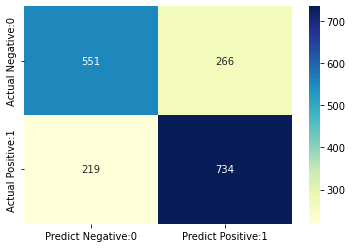

In [49]:
cm = confusion_matrix(valid_y, gridSearch_knn.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## <font color= "Orange">Different Classification Tree Models:
<ol>
  <font color= "Blue"><li>Full Classification tree</li>
      <li>Smaller Classification tree using random controlled parameters</li>
      <li>Smaller Classification tree using Grid Search results</li>
</ol>

In [101]:
# Grow full classification tree using training partition.
fullClassTree = DecisionTreeClassifier()
fullClassTree.fit(train_X_s, train_y)

# Using plotDecisionTree() to visualize the full tree.
plotDecisionTree(fullClassTree, feature_names=train_X_s.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.650772 to fit



In [102]:
# Indetify and display number of nodes in the tree.
tree_nodes = fullClassTree.tree_.node_count
print('Number of nodes:', tree_nodes)

Number of nodes: 2109


In [103]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6040089853467951


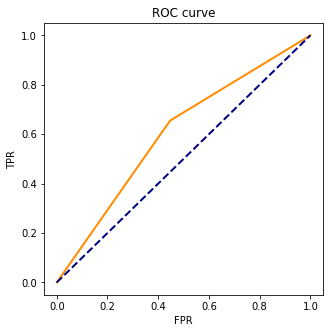

In [104]:
roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [105]:
# Confusion matrices for full classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, fullClassTree.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, fullClassTree.predict(valid_X_s))
print(classification_report(valid_y, fullClassTree.predict(valid_X_s)))

#its a measure for classifictaion measurement
#o means non acceptance and 1 means accept
#287 predicted one and 2713 non accepr
#in valid,98% predicted correctly.1794 predicted correctly and 
#13 predicted incorrrectly(non accepted 13 predicted as accepted)
#166 predicted correctly and 27 predicted incorrectly
#down diagonal correct preedicton and other diagonal is incorrect

# accuracy=1794+166/2000=0.98
# misclassification(error)=27+13/2000=1-accuracy=0.02= 2%
#give idea of how many records are predicted coreect and incorrect in matrix

Training Partition
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition
Confusion Matrix (Accuracy 0.6079)

       Prediction
Actual   0   1
     0 452 365
     1 329 624
              precision    recall  f1-score   support

           0       0.58      0.55      0.57       817
           1       0.63      0.65      0.64       953

    accuracy                           0.61      1770
   macro avg       0.60      0.60      0.60      1770
weighted avg       0.61      0.61      0.61      1770



<AxesSubplot:>

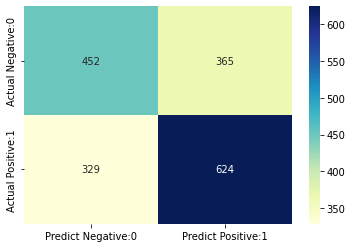

In [106]:
cm = confusion_matrix(valid_y, fullClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller classification tree using DecisionTreeClassifier() control parameters

Small Classification Tree with Control Parameters


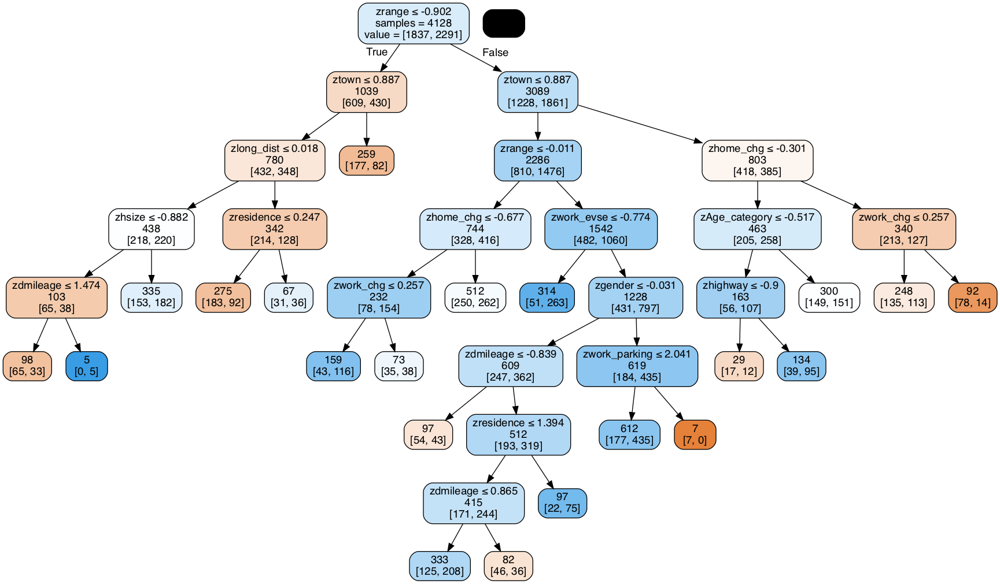

In [107]:
# Create a smaller classification tree for training partition
# using DecisionTreeClassifier() function control parameters:
#  - Maximum Tree depth (number of splits) = 20;
#  - Minimum impurity decrease per split = 0 
#  - Minimum number of sample records in a node for splitting = 30.   
smallClassTree = DecisionTreeClassifier(max_depth=30, 
        min_impurity_decrease=0.001, min_samples_split=20)
smallClassTree.fit(train_X_s, train_y)

# Display classification tree for training partition.
print('Small Classification Tree with Control Parameters')
plotDecisionTree(smallClassTree, feature_names=train_X_s.columns)

In [108]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.631671420920343


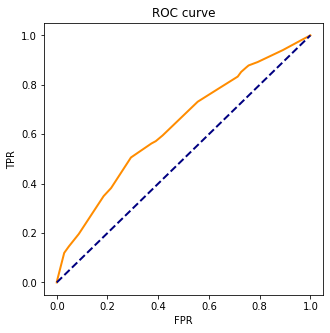

In [109]:
roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [110]:
# Confusion matrices for smaller classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Smaller Tree with control parameters')
classificationSummary(train_y, smallClassTree.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Smaller Tree with control parameters')
classificationSummary(valid_y, smallClassTree.predict(valid_X_s))
print(classification_report(valid_y, smallClassTree.predict(valid_X_s)))


Training Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.6366)

       Prediction
Actual    0    1
     0  762 1075
     1  425 1866

Validation Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.5893)

       Prediction
Actual   0   1
     0 294 523
     1 204 749
              precision    recall  f1-score   support

           0       0.59      0.36      0.45       817
           1       0.59      0.79      0.67       953

    accuracy                           0.59      1770
   macro avg       0.59      0.57      0.56      1770
weighted avg       0.59      0.59      0.57      1770



<AxesSubplot:>

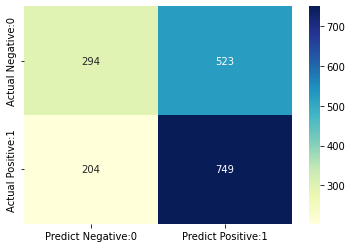

In [111]:
cm = confusion_matrix(valid_y, smallClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller Classification tree using Grid Search results

In [67]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'max_depth': list(range(10, 30)),  
    'min_impurity_decrease': [0.0005,0, 0.001], 
    'min_samples_split': list(range(10, 30)),
}

# Apply GridSearchCV() fucntion for various combinations of
# DecisionTreeClassifier() improved parameters. 
gridSearch = GridSearchCV(DecisionTreeClassifier(), 
                param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X_s, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch.best_score_:.4f}')
print('Improved parameters: ', gridSearch.best_params_)


Improved score:0.6151
Improved parameters:  {'max_depth': 11, 'min_impurity_decrease': 0.0005, 'min_samples_split': 16}


Best Classification Tree with Grid Search


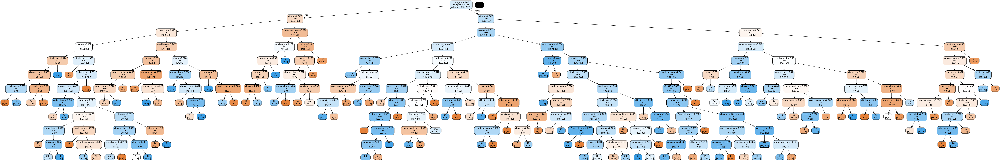

In [68]:
# Create classification tree based on the improved parameters.
bestClassTree = gridSearch.best_estimator_

# Display classification tree based on improved parameters
print('Best Classification Tree with Grid Search')
plotDecisionTree(bestClassTree, feature_names=train_X_s.columns)

In [69]:
# Identify and display number of nodes in the tree
# based on grid search.
tree_nodes_grid = bestClassTree.tree_.node_count
print('Number of nodes:', tree_nodes_grid)

Number of nodes: 275


In [70]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6247988379156975


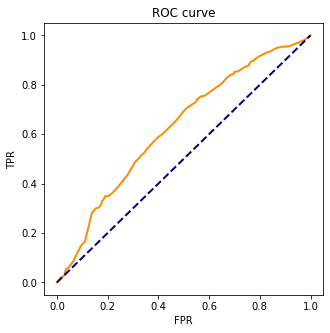

In [71]:
roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [72]:
# Confusion matrices for grid search classification tree. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for classification tree based on grid search')
classificationSummary(train_y, bestClassTree.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for classification tree based on grid search')
classificationSummary(valid_y, bestClassTree.predict(valid_X_s))
print(classification_report(valid_y, bestClassTree.predict(valid_X_s)))

Training Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.7430)

       Prediction
Actual    0    1
     0 1211  626
     1  435 1856

Validation Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.6051)

       Prediction
Actual   0   1
     0 401 416
     1 283 670
              precision    recall  f1-score   support

           0       0.59      0.49      0.53       817
           1       0.62      0.70      0.66       953

    accuracy                           0.61      1770
   macro avg       0.60      0.60      0.60      1770
weighted avg       0.60      0.61      0.60      1770



<AxesSubplot:>

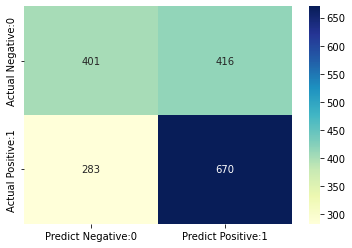

In [73]:
cm = confusion_matrix(valid_y, bestClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Random Forest trees

In [112]:
# Apply RandomForestClassifier() function to develop a combined
# (ensemble) classification tree using Random Forest algorithm.
rf = RandomForestClassifier(n_estimators=1000, random_state=1)
rf.fit(train_X_s, train_y)

# Display number of nodes in Random Forest trees.
n_nodes = rf.estimators_[0].tree_.node_count
print('Number of Nodes in Tree in Random Forest:', n_nodes)

Number of Nodes in Tree in Random Forest: 2177


In [113]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, rf.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.8134050688350002


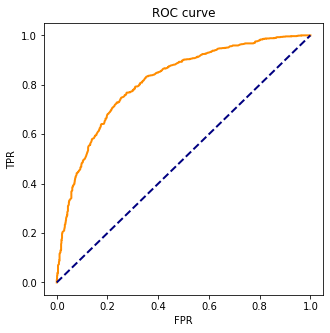

In [114]:
roc_auc_score(valid_y, rf.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, rf.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [115]:
# Confusion matrices for Random Forest classification. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Random Forest Tree')
classificationSummary(train_y, rf.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Random Forest Tree')
classificationSummary(valid_y, rf.predict(valid_X_s))
print(classification_report(valid_y, rf.predict(valid_X_s)))


Training Partition for Random Forest Tree
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition for Random Forest Tree
Confusion Matrix (Accuracy 0.7458)

       Prediction
Actual   0   1
     0 532 285
     1 165 788
              precision    recall  f1-score   support

           0       0.76      0.65      0.70       817
           1       0.73      0.83      0.78       953

    accuracy                           0.75      1770
   macro avg       0.75      0.74      0.74      1770
weighted avg       0.75      0.75      0.74      1770



<AxesSubplot:title={'center':'Confusion Matrix'}>

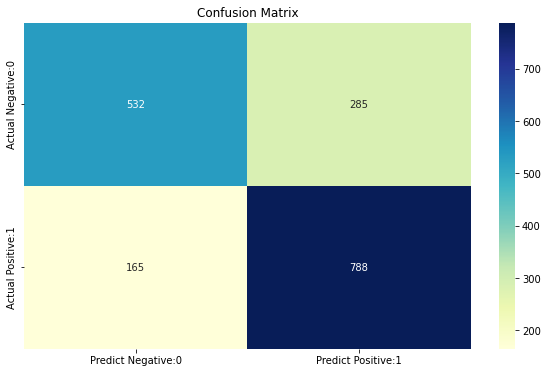

In [116]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Confusion Matrix')
cm = confusion_matrix(valid_y, rf.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# Random forest using Grid search

In [80]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'max_depth': list(range(10, 30)),  
    'min_impurity_decrease': [0.0005, 0.001], 
    'min_samples_split': list(range(10, 30)),
    #'min_samples_leaf': list(range(1,3)),
    #'max_samples': [0.7]
    'random_state':[1]
}

# Apply GridSearchCV() fucntion for various combinations of
# DecisionTreeClassifier() improved parameters. 
gridSearch_rand = GridSearchCV(RandomForestClassifier(), 
                param_grid, cv=5, n_jobs=-1)
gridSearch_rand.fit(train_X_s, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch_rand.best_score_:.4f}')
print('Improved parameters: ', gridSearch_rand.best_params_)


Improved score:0.6909
Improved parameters:  {'max_depth': 15, 'min_impurity_decrease': 0.0005, 'min_samples_split': 11, 'random_state': 1}


In [81]:
# Create classification tree based on the improved parameters.
bestrandTree = gridSearch_rand.best_estimator_


In [82]:
# Display number of nodes in Random Forest trees.
n_nodes_r = bestrandTree.estimators_[0].tree_.node_count
print('Number of Nodes in Tree in Random Forest:', n_nodes_r)

Number of Nodes in Tree in Random Forest: 163


In [84]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch_rand.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7324586020310788


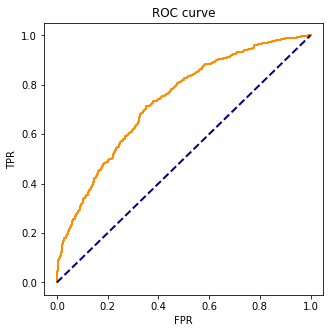

In [85]:
roc_auc_score(valid_y, gridSearch_rand.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch_rand.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [86]:
# Confusion matrices for Random Forest classification. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Random Forest Tree')
classificationSummary(train_y, gridSearch_rand.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Random Forest Tree')
classificationSummary(valid_y, gridSearch_rand.predict(valid_X_s))
print(classification_report(valid_y, gridSearch_rand.predict(valid_X_s)))

Training Partition for Random Forest Tree
Confusion Matrix (Accuracy 0.8094)

       Prediction
Actual    0    1
     0 1229  608
     1  179 2112

Validation Partition for Random Forest Tree
Confusion Matrix (Accuracy 0.6729)

       Prediction
Actual   0   1
     0 402 415
     1 164 789
              precision    recall  f1-score   support

           0       0.71      0.49      0.58       817
           1       0.66      0.83      0.73       953

    accuracy                           0.67      1770
   macro avg       0.68      0.66      0.66      1770
weighted avg       0.68      0.67      0.66      1770



<AxesSubplot:title={'center':'Confusion Matrix'}>

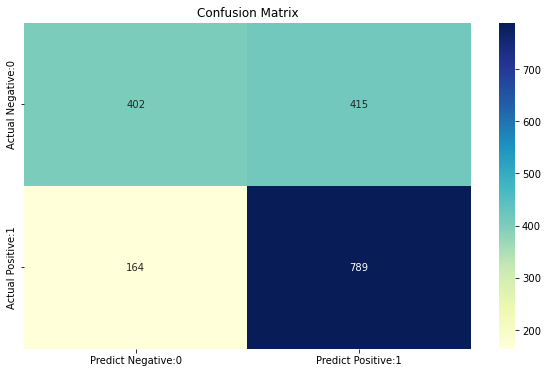

In [88]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Confusion Matrix')
cm = confusion_matrix(valid_y, gridSearch_rand.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Boosted Tree

In [117]:
# Apply GradientBoostingClassifier() function to develop a combined
# boosted tree.  
boost = GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)
boost.fit(train_X_s, train_y)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)

In [118]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, boost.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7467187943503798


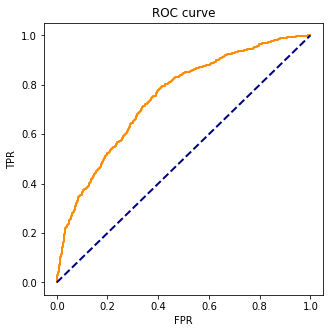

In [119]:
roc_auc_score(valid_y, boost.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, boost.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [120]:
# Confusion matrices for Boosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for Boosted Tree')
classificationSummary(train_y, boost.predict(train_X_s))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for Boosted Tree')
classificationSummary(valid_y, boost.predict(valid_X_s))
print(classification_report(valid_y, boost.predict(valid_X_s)))

Training Partition for Boosted Tree
Confusion Matrix (Accuracy 0.8064)

       Prediction
Actual    0    1
     0 1338  499
     1  300 1991

Validation Partition for Boosted Tree
Confusion Matrix (Accuracy 0.6955)

       Prediction
Actual   0   1
     0 486 331
     1 208 745
              precision    recall  f1-score   support

           0       0.70      0.59      0.64       817
           1       0.69      0.78      0.73       953

    accuracy                           0.70      1770
   macro avg       0.70      0.69      0.69      1770
weighted avg       0.70      0.70      0.69      1770



<AxesSubplot:>

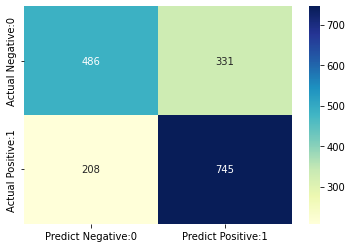

In [121]:
cm = confusion_matrix(valid_y, boost.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# XGboost

In [122]:
xgbc = XGBClassifier(random_state=1,
                n_estimators=500,                
                learning_rate=0.05,      
                subsample=0.7,booster='gbtree')
#print(xgbc)
#XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
#       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
#       n_estimators=100, n_jobs=1, nthread=None,
#       objective='multi:softprob', random_state=0, reg_alpha=0,
#      reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
#      subsample=1, verbosity=1)
xgbc.fit(train_X_s, train_y)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1, ...)

In [123]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, xgbc.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7976845650082648


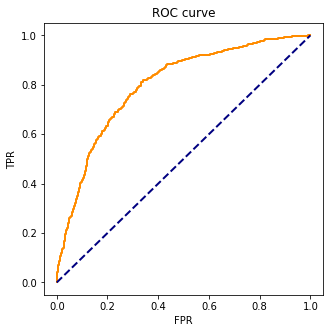

In [124]:
roc_auc_score(valid_y, xgbc.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, xgbc.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [125]:
# Confusion matrices for XGBoosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for XGBoosted Tree')
classificationSummary(train_y, xgbc.predict(train_X_s))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for XGBoosted Tree')
classificationSummary(valid_y, xgbc.predict(valid_X_s))
print(classification_report(valid_y, xgbc.predict(valid_X_s)))

Training Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.9879)

       Prediction
Actual    0    1
     0 1796   41
     1    9 2282

Validation Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.7407)

       Prediction
Actual   0   1
     0 547 270
     1 189 764
              precision    recall  f1-score   support

           0       0.74      0.67      0.70       817
           1       0.74      0.80      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.74      0.74      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:>

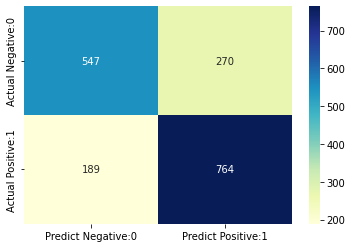

In [126]:
cm = confusion_matrix(valid_y, xgbc.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# XGBoost using Grid search

In [100]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'reg_lambda': [1, 3, 5, 10] 
}

# Apply GridSearchCV() fucntion for various combinations of
# GradientBoostingClassifier() improved parameters. 
gridSearch_XGboost = GridSearchCV(XGBClassifier(n_estimators=500,reg_alpha = 1,max_depth=6,learning_rate=0.05,      
                subsample=0.7,booster='gbtree',random_state=1), 
                param_grid, cv=5, n_jobs=-1)
gridSearch_XGboost.fit(train_X_s, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch_XGboost.best_score_:.4f}')
print('Improved parameters: ', gridSearch_XGboost.best_params_)

[00:11:50] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Improved score:0.7297
Improved parameters:  {'learning_rate': 0.1, 'reg_lambda': 5}


In [102]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch_XGboost.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7940639685795419


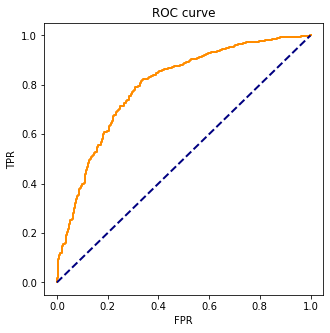

In [104]:
roc_auc_score(valid_y, gridSearch_XGboost.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch_XGboost.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [106]:
# Confusion matrices for XGBoosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for XGBoosted Tree')
classificationSummary(train_y, gridSearch_XGboost.predict(train_X_s))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for XGBoosted Tree')
classificationSummary(valid_y, gridSearch_XGboost.predict(valid_X_s))
print(classification_report(valid_y, gridSearch_XGboost.predict(valid_X_s)))

Training Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.9930)

       Prediction
Actual    0    1
     0 1815   22
     1    7 2284

Validation Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.7407)

       Prediction
Actual   0   1
     0 552 265
     1 194 759
              precision    recall  f1-score   support

           0       0.74      0.68      0.71       817
           1       0.74      0.80      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.74      0.74      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:>

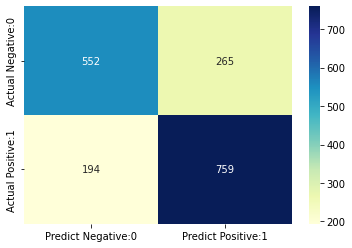

In [108]:
cm = confusion_matrix(valid_y, gridSearch_XGboost.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# LightGBM

In [127]:
lgbmc = LGBMClassifier(random_state=1,
                n_estimators=500,                
                learning_rate=0.05,      
                subsample=0.7)
lgbmc.fit(train_X_s, train_y)


LGBMClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
               subsample=0.7)

In [128]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.798539945363543


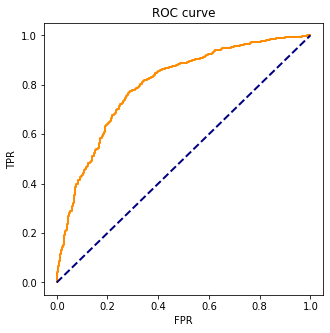

In [129]:
roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [130]:
classificationSummary(train_y, lgbmc.predict(train_X_s))

classificationSummary(valid_y, lgbmc.predict(valid_X_s))
print(classification_report(valid_y, lgbmc.predict(valid_X_s)))

Confusion Matrix (Accuracy 0.9767)

       Prediction
Actual    0    1
     0 1760   77
     1   19 2272
Confusion Matrix (Accuracy 0.7407)

       Prediction
Actual   0   1
     0 544 273
     1 186 767
              precision    recall  f1-score   support

           0       0.75      0.67      0.70       817
           1       0.74      0.80      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.74      0.74      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:>

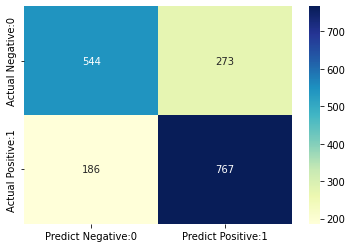

In [131]:
cm = confusion_matrix(valid_y, lgbmc.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# LightGBM with Gridsearch

In [114]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'reg_lambda': [1, 3, 5, 10] 
}

# Apply GridSearchCV() fucntion for various combinations of
# GradientBoostingClassifier() improved parameters. 
gridSearch_LGBM = GridSearchCV(LGBMClassifier(n_estimators=500,reg_alpha = 1,max_depth=6,learning_rate=0.05,      
                subsample=0.7,booster='gbtree',random_state=1), 
                param_grid, cv=5, n_jobs=-1)
gridSearch_LGBM.fit(train_X_s, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch_LGBM.best_score_:.4f}')
print('Improved parameters: ', gridSearch_LGBM.best_params_)

[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).

Improved score:0.7192
Improved parameters:  {'learning_rate': 0.2, 'reg_lambda': 3}


In [115]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch_LGBM.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7925420080374929


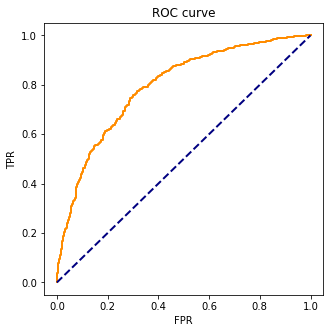

In [116]:
roc_auc_score(valid_y, gridSearch_LGBM.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch_LGBM.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [117]:
classificationSummary(train_y, gridSearch_LGBM.predict(train_X_s))

classificationSummary(valid_y, gridSearch_LGBM.predict(valid_X_s))
print(classification_report(valid_y, gridSearch_LGBM.predict(valid_X_s)))

Confusion Matrix (Accuracy 0.9893)

       Prediction
Actual    0    1
     0 1802   35
     1    9 2282
Confusion Matrix (Accuracy 0.7288)

       Prediction
Actual   0   1
     0 549 268
     1 212 741
              precision    recall  f1-score   support

           0       0.72      0.67      0.70       817
           1       0.73      0.78      0.76       953

    accuracy                           0.73      1770
   macro avg       0.73      0.72      0.73      1770
weighted avg       0.73      0.73      0.73      1770



<AxesSubplot:>

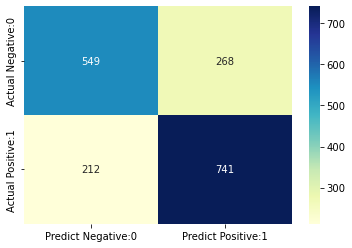

In [119]:
cm = confusion_matrix(valid_y, gridSearch_LGBM.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural Network Model

## <font color= "Orange">Different Neural Network Models:
<ol>
  <font color= "Blue"><li>Neural Network Model using multiple Predictors</li>
      <li>Neural Network Model Based on Grid Search</li>
</ol>

## Neural network Model 

In [132]:
# Create outcome and predictors to run neural network
# model.
#outcome = 'bichoice'
#drop = ['bichoice','highway','town','state','home_park']
#predictors = [c for c in EV_intention_df.columns if c != drop]


# Create predictors and outcome variables.  
#X = EV_intention_df.drop(columns=['bichoice','state','zipcode'])
#y = EV_intention_df['bichoice']

# Partition data into training (60% or 0.6) and validation(40% or 0.4)
# of the EV_intention_df data frame.
#train_X, valid_X, train_y, valid_y = train_test_split(X, y, 
#                            test_size=0.2, random_state=1)

# Use MLPCclassifier() function to train neural network model.
# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 3 nodes (default is 2); 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_intention_clf = MLPClassifier(hidden_layer_sizes=(3), max_iter=10000,activation='logistic',
                    solver='lbfgs', random_state=1)
EV_intention_clf.fit(train_X_s, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model')
print(EV_intention_clf.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model')
print(EV_intention_clf.coefs_)

Final Intercepts for EV intention Neural Network Model
[array([-44.8849173 , -55.54447114,  41.02724946]), array([1.21267499])]

Network Weights for EV intention Neural Network Model
[array([[-25.73983782,  19.48674739, -40.94130035],
       [ 24.01930489, -16.77959786,  -3.87851091],
       [  3.32511261, -32.27229474,  30.36516761],
       [ 17.48840532, -22.23369872,  29.5709041 ],
       [ -2.59627332,  -4.72628285, -10.91411838],
       [ 25.28760123, 117.02918091, -25.31973992],
       [-21.77302029,   6.69041548,  36.37534423],
       [ 22.20351642, 128.5019091 ,  -5.87001902],
       [  2.47547917, -42.14154999, -55.57889919],
       [ -0.52343033, -20.36364102, -11.45960916],
       [-16.47128455,  20.40480953,  72.72398402],
       [ -4.22936277,  24.11221065,  56.36496823],
       [  0.90643109,  11.41144991, -12.01068437],
       [ 14.66107006,  20.8410449 ,  -0.12918047],
       [-28.15989229,  96.80260911,   8.31834518],
       [  0.77021654,  97.31675615,  30.38579094],


In [133]:
# Make Ev intention classification for validation set 
# using EV intention neural network model. 

# Use EV_intention_clf model to classify EV intention
# for validation set.
EV_Intention_pred = EV_intention_clf.predict(valid_X_s)

# Predict target probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob = np.round(EV_intention_clf.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob],
                'p(1)': [p[1] for p in EV_pred_prob],
                'Classification': EV_Intention_pred})

print('Classification for EV intention data for Validation Partition')
print(EV_pred_result.head(10))

Classification for EV intention data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.5830  0.4170               0
3219      1  0.3178  0.6822               1
4436      0  0.8829  0.1171               0
3887      1  0.6161  0.3839               0
3656      1  0.2292  0.7708               1
3680      1  0.3178  0.6822               1
1513      1  0.1200  0.8800               1
79        1  0.2292  0.7708               1
4072      1  0.2292  0.7708               1
3259      0  0.5830  0.4170               0


In [134]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6040802670430683


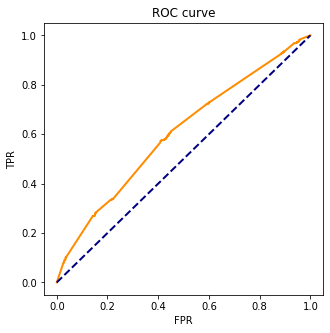

In [135]:
roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [136]:
# Confusion matrices for EV intention neural network model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model')
classificationSummary(train_y, EV_intention_clf.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model')
classificationSummary(valid_y, EV_intention_clf.predict(valid_X_s))
print(classification_report(valid_y, EV_intention_clf.predict(valid_X_s)))

Training Partition for Neural Network Model
Confusion Matrix (Accuracy 0.6923)

       Prediction
Actual    0    1
     0 1294  543
     1  727 1564

Validation Partition for Neural Network Model
Confusion Matrix (Accuracy 0.5785)

       Prediction
Actual   0   1
     0 461 356
     1 390 563
              precision    recall  f1-score   support

           0       0.54      0.56      0.55       817
           1       0.61      0.59      0.60       953

    accuracy                           0.58      1770
   macro avg       0.58      0.58      0.58      1770
weighted avg       0.58      0.58      0.58      1770



<AxesSubplot:>

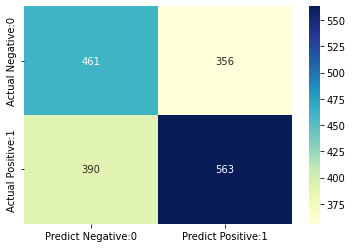

In [137]:
cm = confusion_matrix(valid_y, EV_intention_clf.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural network Model using Grid Search

In [126]:
# Identify grid search parameters. 
param_grid = {
    'hidden_layer_sizes': list(range(2, 20)), 
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer. 
gridSearch = GridSearchCV(MLPClassifier(solver='lbfgs', max_iter=10000, random_state=1), 
                          param_grid, cv=5, n_jobs=-1, return_train_score=True)
gridSearch.fit(train_X_s, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch.best_score_:.4f}')
print('Best parameter: ', gridSearch.best_params_)

Best score:0.6517
Best parameter:  {'hidden_layer_sizes': 18}


In [127]:
# Use MLPCclassifier() function to train the improved neural network model
# based on grid search results. 

# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 10 nodes based on grid search; 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_clf_imp = MLPClassifier(hidden_layer_sizes=(18), max_iter=10000,
                activation='logistic', solver='lbfgs', random_state=1)
EV_clf_imp.fit(train_X_s, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.coefs_)

Final Intercepts for EV intention Neural Network Model based on grid search
[array([ 56.68440417,  -1.62266991,  -6.72434793,  -8.2297189 ,
        48.82650434, -22.47808299, -57.97575443,  16.84583455,
        15.16583369, -48.55834705, -52.45885827, -19.05346788,
        29.81224125,  46.05314316, -28.89584997,  -7.32505367,
       -37.58410156, -56.23411323]), array([4.98418726])]

Network Weights for EV intention Neural Network Model based on grid search
[array([[-2.88505899e+01,  1.51512297e+01, -1.88084179e+00,
         1.35071081e+02, -5.99471984e+00, -2.11400837e+01,
         1.35384158e+01, -1.44233487e+01, -2.09709008e+01,
        -1.02074169e+00, -3.76759002e+01,  1.10655846e+01,
        -1.15989683e+01,  6.58691691e+00,  1.07302864e+01,
        -4.37743248e+00,  5.65037986e+01,  1.79791047e+01],
       [-1.48339166e+01,  6.37954802e+00,  4.18756277e+01,
        -3.00200062e+01, -2.54651112e+00,  9.13492489e+00,
         2.33168958e+01,  6.17652335e+00, -5.77632631e+00,
    

In [128]:
# Make EV intention classification for validation set 
# using EV intention neural network model. 

# Use EV_clf_imp model to classify EV intention
# for validation set.
EV_pred_imp = EV_clf_imp.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_imp = np.round(EV_clf_imp.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_imp_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_imp],
                'p(1)': [p[1] for p in EV_pred_prob_imp],
                'Classification': EV_pred_imp})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_imp_result.head(10))

Classification for EV intention Data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.0008  0.9992               1
3219      1  0.3185  0.6815               1
4436      0  0.9923  0.0077               0
3887      1  0.0161  0.9839               1
3656      1  0.0018  0.9982               1
3680      1  0.9996  0.0004               0
1513      1  0.1928  0.8072               1
79        1  0.8903  0.1097               0
4072      1  0.3525  0.6475               1
3259      0  0.9281  0.0719               0


In [129]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6854987342682581


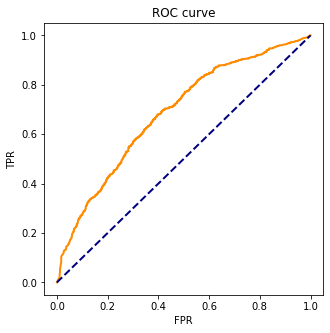

In [130]:
roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_imp[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [131]:
# Confusion matrices for improved neural network model for EV intention
# using grid search results. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model based on grid search')
classificationSummary(train_y, EV_clf_imp.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model based on grid search')
classificationSummary(valid_y, EV_clf_imp.predict(valid_X_s))
print(classification_report(valid_y, EV_clf_imp.predict(valid_X_s)))

Training Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.8944)

       Prediction
Actual    0    1
     0 1592  245
     1  191 2100

Validation Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.6424)

       Prediction
Actual   0   1
     0 467 350
     1 283 670
              precision    recall  f1-score   support

           0       0.62      0.57      0.60       817
           1       0.66      0.70      0.68       953

    accuracy                           0.64      1770
   macro avg       0.64      0.64      0.64      1770
weighted avg       0.64      0.64      0.64      1770



<AxesSubplot:>

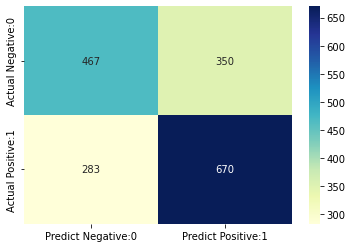

In [132]:
cm = confusion_matrix(valid_y, EV_clf_imp.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# Neural network Model using Grid Search with more hyper tuning

In [133]:
# Identify grid search parameters. 
param_grid = {
    'hidden_layer_sizes': list(range(2, 20)), 
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer. 
gridSearch = GridSearchCV(MLPClassifier(max_iter=100, random_state=1), 
                          param_grid, cv=5, n_jobs=-1, return_train_score=True)
gridSearch.fit(train_X_s, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch.best_score_:.4f}')
print('Best parameter: ', gridSearch.best_params_)

/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of 

/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of 

/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of 

/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of 

/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of 

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/n

Best score:0.6490
Best parameter:  {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': 16, 'learning_rate': 'constant', 'solver': 'adam'}


In [134]:
# Use MLPCclassifier() function to train the improved neural network model
# based on grid search results. 

# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 10 nodes based on grid search; 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_clf_imp = MLPClassifier(hidden_layer_sizes=(18), max_iter=10000,
                activation='logistic', solver='lbfgs', random_state=1)
EV_clf_imp.fit(train_X_s, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.coefs_)

Final Intercepts for EV intention Neural Network Model based on grid search
[array([ 56.68440417,  -1.62266991,  -6.72434793,  -8.2297189 ,
        48.82650434, -22.47808299, -57.97575443,  16.84583455,
        15.16583369, -48.55834705, -52.45885827, -19.05346788,
        29.81224125,  46.05314316, -28.89584997,  -7.32505367,
       -37.58410156, -56.23411323]), array([4.98418726])]

Network Weights for EV intention Neural Network Model based on grid search
[array([[-2.88505899e+01,  1.51512297e+01, -1.88084179e+00,
         1.35071081e+02, -5.99471984e+00, -2.11400837e+01,
         1.35384158e+01, -1.44233487e+01, -2.09709008e+01,
        -1.02074169e+00, -3.76759002e+01,  1.10655846e+01,
        -1.15989683e+01,  6.58691691e+00,  1.07302864e+01,
        -4.37743248e+00,  5.65037986e+01,  1.79791047e+01],
       [-1.48339166e+01,  6.37954802e+00,  4.18756277e+01,
        -3.00200062e+01, -2.54651112e+00,  9.13492489e+00,
         2.33168958e+01,  6.17652335e+00, -5.77632631e+00,
    

In [135]:
# Make EV intention classification for validation set 
# using EV intention neural network model. 

# Use EV_clf_imp model to classify EV intention
# for validation set.
EV_pred_imp = EV_clf_imp.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_imp = np.round(EV_clf_imp.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_imp_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_imp],
                'p(1)': [p[1] for p in EV_pred_prob_imp],
                'Classification': EV_pred_imp})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_imp_result.head(10))

Classification for EV intention Data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.0008  0.9992               1
3219      1  0.3185  0.6815               1
4436      0  0.9923  0.0077               0
3887      1  0.0161  0.9839               1
3656      1  0.0018  0.9982               1
3680      1  0.9996  0.0004               0
1513      1  0.1928  0.8072               1
79        1  0.8903  0.1097               0
4072      1  0.3525  0.6475               1
3259      0  0.9281  0.0719               0


In [136]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6854987342682581


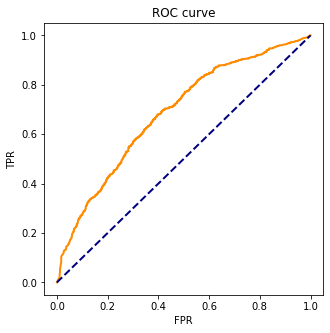

In [137]:
roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_imp[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [138]:
# Confusion matrices for improved neural network model for EV intention
# using grid search results. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model based on grid search')
classificationSummary(train_y, EV_clf_imp.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model based on grid search')
classificationSummary(valid_y, EV_clf_imp.predict(valid_X_s))
print(classification_report(valid_y, EV_clf_imp.predict(valid_X_s)))

Training Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.8944)

       Prediction
Actual    0    1
     0 1592  245
     1  191 2100

Validation Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.6424)

       Prediction
Actual   0   1
     0 467 350
     1 283 670
              precision    recall  f1-score   support

           0       0.62      0.57      0.60       817
           1       0.66      0.70      0.68       953

    accuracy                           0.64      1770
   macro avg       0.64      0.64      0.64      1770
weighted avg       0.64      0.64      0.64      1770

